In [1]:
import sys
sys.path.append("../scripts")

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [13]:
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import colors
import numpy as np
import seaborn as sns
import torch
import wandb
from rasterio.features import sieve
from torchmetrics.classification import ConfusionMatrix, F1Score, Accuracy
from model import PixelLM
from dataset import PixelLDM
from wikidata import S2A_LULC_CLS, S2A_LULC_COLORS

In [4]:
CKPT = "../logs/pixel/baseline-05/version_0/checkpoints/epoch:18-step:2204-loss:0.939-f1score:0.813.ckpt"
model = PixelLM.load_eval_checkpoint(CKPT, device=torch.device("cuda"))
dm = PixelLDM(
        cubes_dir=Path("data/cubes"),
        num_bands=10,
        timestep=13,
        lc_klass=S2A_LULC_CLS,
        lc_colors=S2A_LULC_COLORS,
        batch_size=8,
        num_workers=12,
    )

In [5]:
dm.setup("fit")

In [14]:
colors_list = list(dm.train_ds.id2colors.values())
colors_list = [[band/255 for band in color] for color in colors_list]
lulc_cmap = colors.ListedColormap(colors_list)

In [15]:
data_dir = Path("../data/cubesxy/test/")

In [16]:
!ls {data_dir} | head

3448-7273-14.npz
3455-7277-14.npz
3460-7291-14.npz
3466-7224-14.npz
3470-7220-14.npz
3472-7215-14.npz
3472-7216-14.npz
3473-7226-14.npz
3473-7239-14.npz
3473-7297-14.npz


In [19]:
def plot(xyz):
    sample = np.load(xyz, allow_pickle=True)
    h,w = sample["y"].shape

    X = sample["X"].reshape(-1, 13, 10)
    X = torch.from_numpy(X.astype(np.float32)).transpose(1,2).to("cuda")
    
    logits = model(X)

    y_pred = torch.argmax(torch.softmax(logits, dim=1), dim=1).reshape((h, w))
    y_pred = y_pred.detach().cpu().numpy().astype(np.uint8)
    y_pred = sieve(y_pred, size=10) # remove small polygons < 10 pixels size
    y = dm.train_ds.label_tfm(sample["y"]) # adjust the masks value for GT based on data pre-processing

    fig, axes = plt.subplots(nrows=1, ncols=13, figsize=(65, 5))
    for i,ax in enumerate(axes.flatten()):
        ax.imshow((sample["X"][:,:,i,[2,1,0]]/3000))

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
    axes[0].imshow(y, cmap=lulc_cmap, vmin=0, vmax=9)
    axes[1].imshow(y_pred, cmap=lulc_cmap, vmin=0, vmax=9)
    
    plt.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

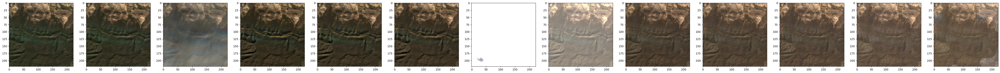

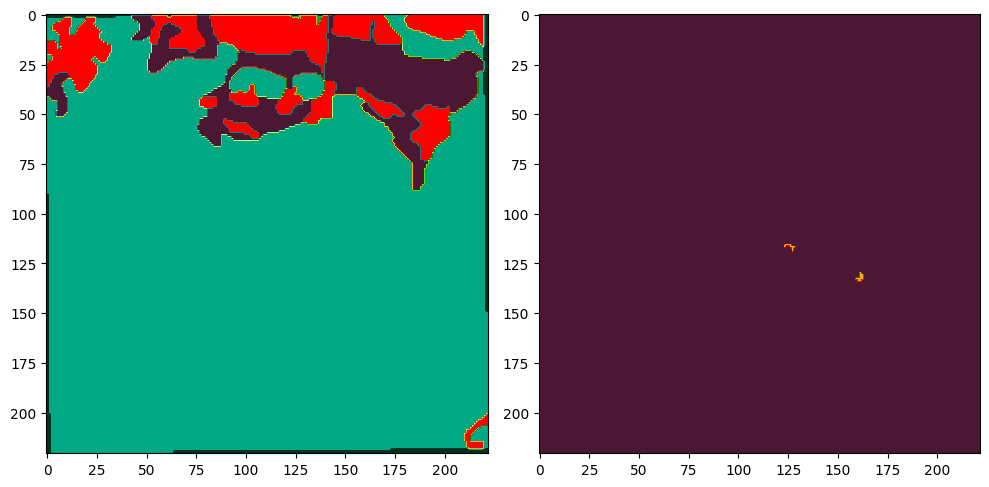

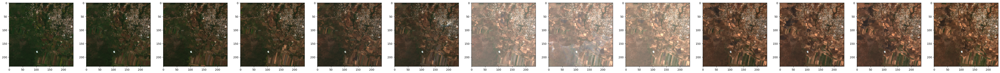

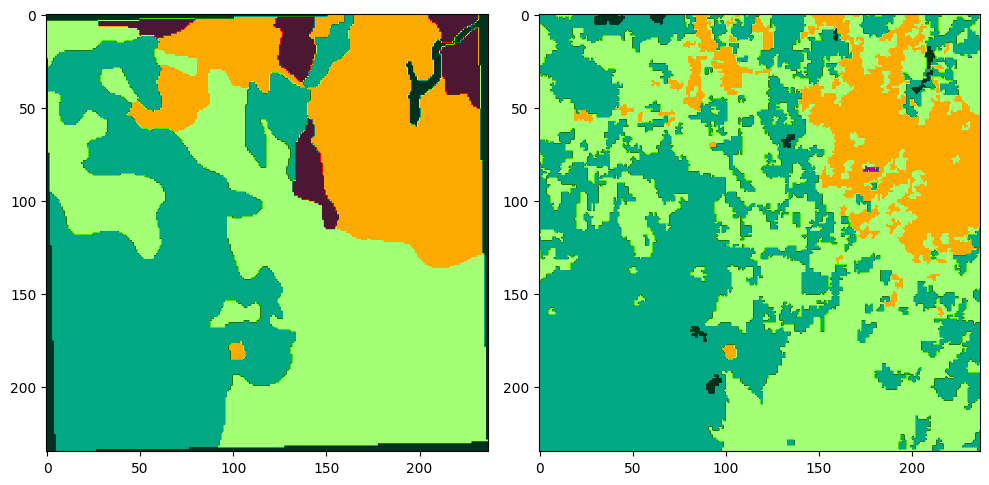

In [20]:
for xyz in list(data_dir.glob("*.npz"))[:2]:
    plot(xyz)

In [23]:
def animate(xyz):
    # store animations inside animate/
    Path("animate").mkdir(exist_ok=True)
    
    sample = np.load(xyz, allow_pickle=True)
    h,w = sample["y"].shape

    X = sample["X"].reshape(-1, 13, 10)
    X = torch.from_numpy(X.astype(np.float32)).transpose(1,2).to("cuda")
    
    logits = model(X)

    y_pred = torch.argmax(torch.softmax(logits, dim=1), dim=1).reshape((h, w))
    y_pred = y_pred.detach().cpu().numpy().astype(np.uint8)
    y_pred = sieve(y_pred, size=10) # remove small polygons < 10 pixels size
    # y = dm.train_ds.label_tfm(sample["y"]) # adjust the masks value for GT based on data pre-processing
    
    fig, ax = plt.subplots()
    def update(frame):
        ax.clear()
        X = sample["X"][:,:,frame,[2,1,0]]/3000
        ax.imshow(X)
        ax.imshow(y_pred, cmap=lulc_cmap, vmin=0, vmax=9, alpha=0.35)
        ax.set_title("TS {}".format(frame))
        ax.axis("off")

    animation_obj = animation.FuncAnimation(fig, update, frames=len(range(13)), interval=500)
    animation_obj.save(f"animate/{xyz.stem}.gif", writer='pillow')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

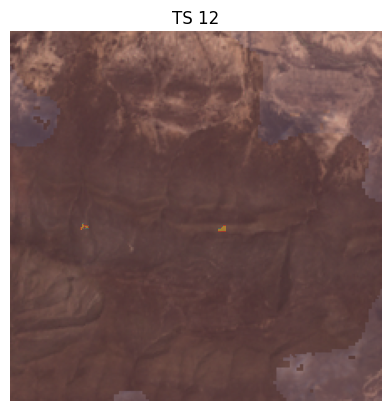

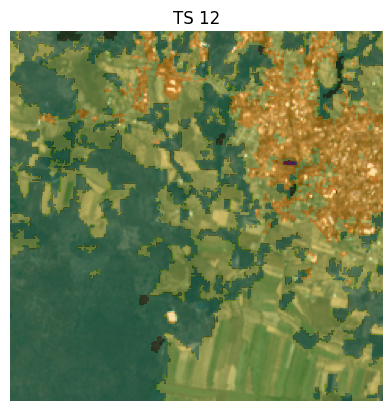

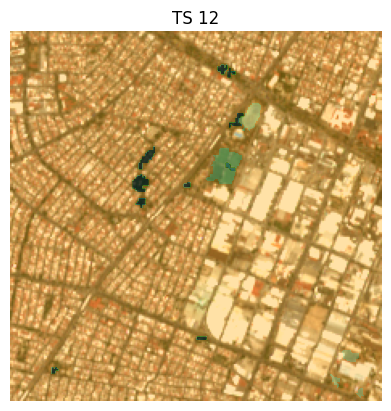

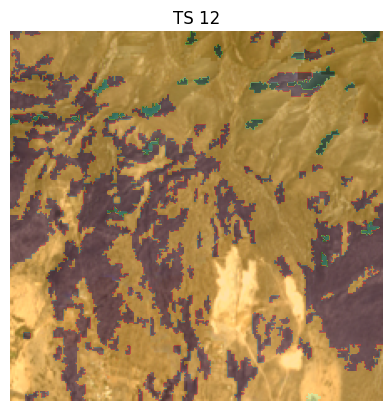

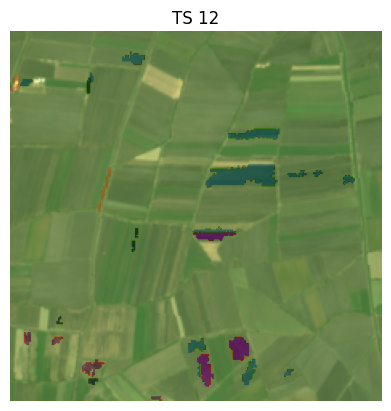

...

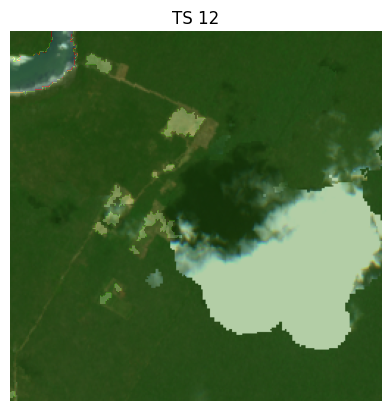

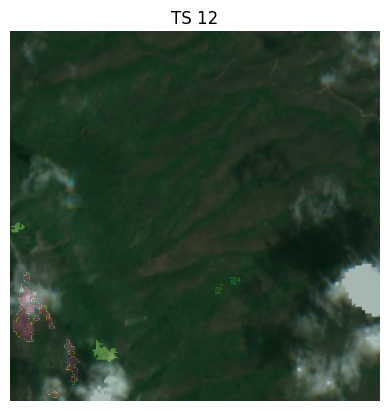

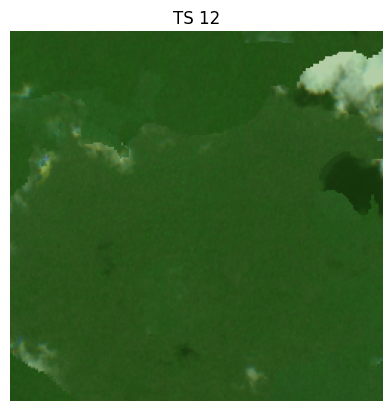

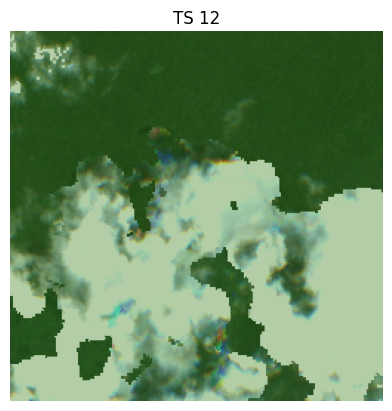

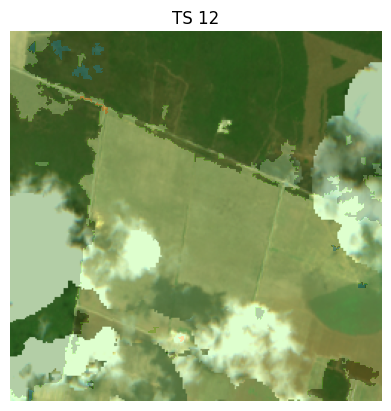

In [25]:
for xyz in list(data_dir.glob("*.npz"))[:30]:
    animate(xyz)